# COVID19の世界の感染状況分析用ノートブック

In [1]:
#!pip install geopandas
#!conda update -n base -c defaults conda
#!conda install -y numpy pandas

## 初期化コード
1. ライブラリのインポート
2. ヘルパ関数の定義
　display_full: pandasのDataFrameを省略せずに全行表示する

In [2]:
import pandas as pd
import csv
import os,sys,json
from datetime import datetime, timedelta, date
import matplotlib
import matplotlib.pylab as plt
import re
from pylab import *
import tqdm
import numpy as np
import geopandas as gpd
%matplotlib inline
font = {'family' : 'Noto Sans CJK JP'}
matplotlib.rc('font', **font)

In [3]:
%%html

<style>
    .jp-OutputArea-child {
        display: inline-block;
    }
</style>

In [4]:
def display_full(df):
    max_rows = pd.get_option('display.max_rows')
    pd.set_option('display.max_rows', None)
    display(df)
    pd.set_option('display.max_rows', max_rows)

## データセットの取得
1. covid19の感染状況の集計データセット(Our World in Dataのデータセットを利用)

In [5]:
!mkdir -p data
!wget -O data/owid-covid-data.csv https://covid.ourworldindata.org/data/owid-covid-data.csv

--2021-04-27 04:55:31--  https://covid.ourworldindata.org/data/owid-covid-data.csv
covid.ourworldindata.org (covid.ourworldindata.org) をDNSに問いあわせています... 2606:4700:3038::6815:e98a, 2606:4700:3038::6815:e989, 104.21.233.137, ...
covid.ourworldindata.org (covid.ourworldindata.org)|2606:4700:3038::6815:e98a|:443 に接続しています... 接続しました。
HTTP による接続要求を送信しました、応答を待っています... 200 OK
長さ: 特定できません [text/csv]
`data/owid-covid-data.csv' に保存中

data/owid-covid-dat     [             <=>    ]  20.78M  6.99MB/s    in 3.0s    

2021-04-27 04:55:34 (6.99 MB/s) - `data/owid-covid-data.csv' へ保存終了 [21787047]



2. ISO3166の国別コード表。コード名を国名に変換するために利用

In [6]:
!wget -O data/iso3166.txt http://www.davros.org/misc/iso3166.txt

--2021-04-27 04:55:34--  http://www.davros.org/misc/iso3166.txt
www.davros.org (www.davros.org) をDNSに問いあわせています... 88.98.24.67
www.davros.org (www.davros.org)|88.98.24.67|:80 に接続しています... 接続しました。
HTTP による接続要求を送信しました、応答を待っています... 200 OK
長さ: 9591 (9.4K) [text/plain]
`data/iso3166.txt' に保存中

data/iso3166.txt    100%[===================>]   9.37K  --.-KB/s    in 0.001s  

2021-04-27 04:55:35 (17.0 MB/s) - `data/iso3166.txt' へ保存完了 [9591/9591]



## データセットの読込
1. covid19の感染状況データセットの読込

In [7]:
df = pd.read_csv("data/owid-covid-data.csv")
display(df)
df.columns

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84092,ZWE,Africa,Zimbabwe,2021-04-21,37980.0,105.0,87.286,1555.0,1.0,1.000,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
84093,ZWE,Africa,Zimbabwe,2021-04-22,38018.0,38.0,85.143,1555.0,0.0,0.714,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
84094,ZWE,Africa,Zimbabwe,2021-04-23,38045.0,27.0,73.000,1556.0,1.0,0.714,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
84095,ZWE,Africa,Zimbabwe,2021-04-24,38064.0,19.0,52.143,1556.0,0.0,0.571,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571


Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'new_vaccinations',
       'new_vaccinations_smoothed', 'total_vaccinations_per_hun

2. 国別にデータセットを分割

In [8]:
data = {}
df["date"] = pd.to_datetime(df["date"])
for country, d in df.groupby("iso_code"):
    if country and not country.startswith("OWID_"):
        d = d.set_index("date")
        data[country] = d
print(data.keys())

dict_keys(['ABW', 'AFG', 'AGO', 'AIA', 'ALB', 'AND', 'ARE', 'ARG', 'ARM', 'ATG', 'AUS', 'AUT', 'AZE', 'BDI', 'BEL', 'BEN', 'BFA', 'BGD', 'BGR', 'BHR', 'BHS', 'BIH', 'BLR', 'BLZ', 'BMU', 'BOL', 'BRA', 'BRB', 'BRN', 'BTN', 'BWA', 'CAF', 'CAN', 'CHE', 'CHL', 'CHN', 'CIV', 'CMR', 'COD', 'COG', 'COL', 'COM', 'CPV', 'CRI', 'CUB', 'CUW', 'CYM', 'CYP', 'CZE', 'DEU', 'DJI', 'DMA', 'DNK', 'DOM', 'DZA', 'ECU', 'EGY', 'ERI', 'ESP', 'EST', 'ETH', 'FIN', 'FJI', 'FLK', 'FRA', 'FRO', 'FSM', 'GAB', 'GBR', 'GEO', 'GGY', 'GHA', 'GIB', 'GIN', 'GMB', 'GNB', 'GNQ', 'GRC', 'GRD', 'GRL', 'GTM', 'GUY', 'HKG', 'HND', 'HRV', 'HTI', 'HUN', 'IDN', 'IMN', 'IND', 'IRL', 'IRN', 'IRQ', 'ISL', 'ISR', 'ITA', 'JAM', 'JEY', 'JOR', 'JPN', 'KAZ', 'KEN', 'KGZ', 'KHM', 'KNA', 'KOR', 'KWT', 'LAO', 'LBN', 'LBR', 'LBY', 'LCA', 'LIE', 'LKA', 'LSO', 'LTU', 'LUX', 'LVA', 'MAC', 'MAR', 'MCO', 'MDA', 'MDG', 'MDV', 'MEX', 'MHL', 'MKD', 'MLI', 'MLT', 'MMR', 'MNE', 'MNG', 'MOZ', 'MRT', 'MSR', 'MUS', 'MWI', 'MYS', 'NAM', 'NER', 'NGA', 'N

3. 国別コード→国名の変換表を作成

In [9]:
def parse_matched(line):
    matched = re.match("^(..) (...) (...) (.*)", line)
    if not matched:
        return None
    country = matched[4].split(",")
    return [matched[1], matched[2], matched[3], country[0]]

def get_country(code):
    return codes[code] if code in codes else code

with open("data/iso3166.txt","r") as f:
    code_list = [parse_matched(line) for line in f]
    codes = dict([(c[1], c[3]) for c in code_list if not c is None])
pd.DataFrame([c for c in code_list if not c is None], columns = ("alpha-2", "alpha-3", "code", "name"))

,alpha-2,alpha-3,code,name
0,AF,AFG,004,Afghanistan
1,AL,ALB,008,Albania
2,DZ,DZA,012,Algeria
3,AS,ASM,016,American Samoa
4,AD,AND,020,Andorra
...,...,...,...,...
273,YD,YMD,720,Yemen
274,YE,YEM,886,Yemen
275,YU,YUG,890,Yugoslavia
276,YU,YUG,891,Yugoslavia


## 各国データの表示


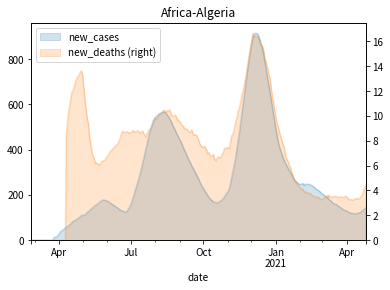

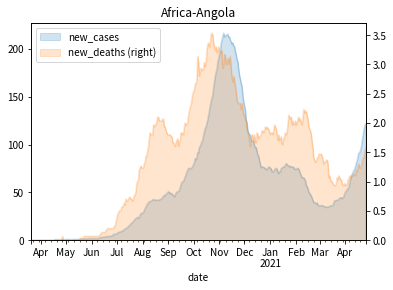

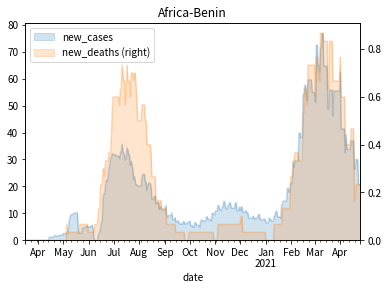

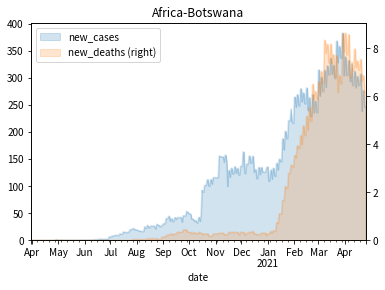

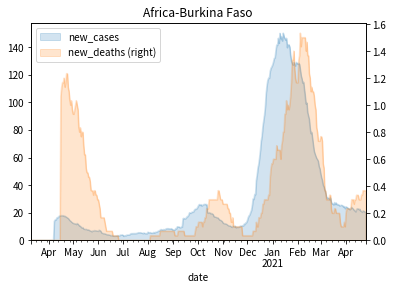

...

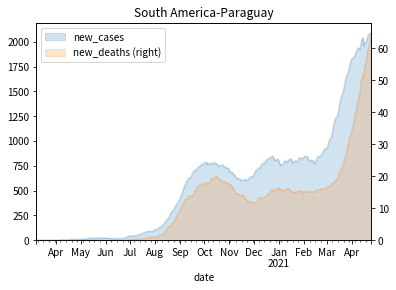

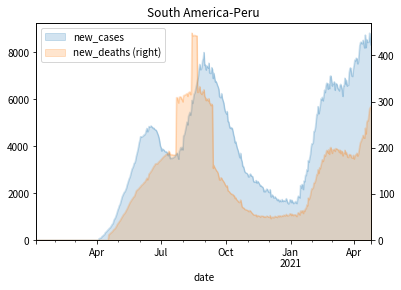

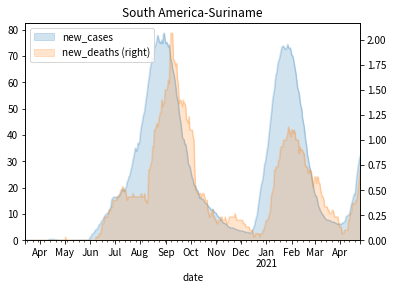

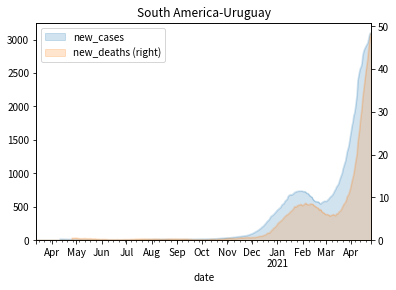

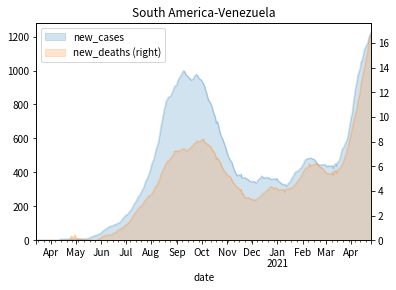

In [10]:
if True:
    !mkdir -p world_trends/country
    sorted_figs = []
    for country, df in data.items():
        continent = df["continent"][0]
#        fig, ax = plt.subplots()
        title = "%s-%s"%(continent, codes[country]) if codes.get(country) else country
        df2 = df[["new_cases","new_deaths"]].rolling(30).mean().fillna(0)
        ax = df2.plot(kind="area", stacked=False, alpha=0.2, title=title, ylim=(0,None), secondary_y=["new_deaths"])
        ax2 = ax.figure.get_axes()
        ax2[1].set_ylim(0,None)
        sorted_figs.append((title, ax.figure))
        ax.figure
        plt.savefig("world_trends/country/avg/%s-mean.png"%country)
        plt.close(ax.figure)
    sorted_figs = sorted(sorted_figs, key=lambda x: x[0])
    for title, fig in sorted_figs:
        display(fig)

## 統計処理
### 各国の陽性者数、死者数の集計

In [11]:
new_cases_label = "new_cases_per_million"
new_deaths_label = "new_deaths_per_million"
freq = 15

def calc_monthly(df):
    df2=df.reset_index()
#    result = df2.groupby([df2["date"].dt.year, df2["date"].dt.month]).mean()
    result = df2.groupby(pd.Grouper(key="date", freq="%dd"%freq, base=df2.shape[0] % freq )).mean()
    return result

trends = {}
for country, df in data.items():
    trends[country] = df[[new_cases_label, new_deaths_label, "continent"]]

def calc_trend_map(c, df):
    monthly = calc_monthly(df.drop("continent", axis=1))
    return (get_country(c), 
     df["continent"][0], 
     monthly[new_cases_label].values[-1], 
     monthly[new_deaths_label].values[-1])

trend_map = pd.DataFrame([calc_trend_map(country, df) for country, df in trends.items()],
                        columns=["country" , "continent", new_cases_label, new_deaths_label])

#display_full(trend_map.sort_values("new_cases", ascending=False).reset_index())

/home/seagetch/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  


### 陽性者の増減の傾向を計算
1. 各国の陽性者数の月別集計を実施
2. 前月との差分を計算

In [12]:
def calc_trends(df):
    monthly = calc_monthly(df)
    diff = monthly.diff()
    return (diff/monthly).fillna(0)

recents = pd.DataFrame([[get_country(c)] + list(calc_trends(df).iloc[-1]) for c, df in trends.items()], columns=["country", "trend_cases", "trend_deaths"])
status = pd.merge(trend_map, recents, on="country")
display(status)

/home/seagetch/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  


,country,continent,new_cases_per_million,new_deaths_per_million,trend_cases,trend_deaths
0,Aruba,North America,NaN,NaN,0.000000,0.000000
1,Afghanistan,Asia,2.909600,0.104600,0.476148,0.115360
2,Angola,Africa,4.620800,0.058733,0.398589,0.380250
3,Anguilla,North America,NaN,NaN,0.000000,0.000000
4,Albania,Europe,55.180933,1.575067,-1.073472,-0.735461
...,...,...,...,...,...,...
205,Samoa,Oceania,0.000000,NaN,0.000000,0.000000
206,Yemen,Asia,1.924600,0.348667,-0.598081,-0.352581
207,South Africa,Africa,20.170267,1.002733,0.194831,0.266871
208,Zambia,Africa,5.222000,0.072400,-0.621512,-0.603131


## 可視化

In [13]:
ymin=10**-2
ymax=10**3
xmin=-2
xmax=2
cmap = plt.get_cmap('Set2')
colors = [cmap(c / 8) for c in np.arange(1, 8)]
countries = [get_country(c) for c in 
             ["JPN","KOR","CHN", "IND", "TWN", "THA",
              "FRA", "DEU", "GBR", "SWE",
              "USA", "BRA","MYS", "ISR"]]

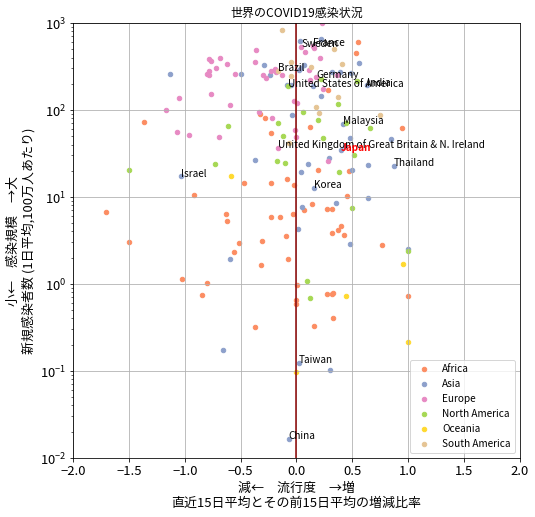

In [14]:
fig,ax=plt.subplots(1,1, figsize=(8,8))
i=0
for continent, df in status.groupby("continent"):
    df.plot(ax=ax, kind="scatter", grid=True, 
            x="trend_cases", xlim=(xmin,xmax), 
            y=new_cases_label, logy=True, ylim=(ymin, ymax), 
            color=colors[i], vmin=-1, vmax=1, 
            colorbar=False,
            title="世界のCOVID19感染状況", label=continent, fontsize=13)
    i+=1
for i,r in status.iterrows():
    x = r["trend_cases"]
    y = r[new_cases_label]
    country = r["country"]
    if country in countries:
        if xmin <= x and x < xmax and ymin <= y and y < ymax:
            if country == "Japan":
                color = "red"
                fontweight = "heavy"
            else:
                color = "black"
                fontweight = "normal"

            ax.annotate(country, xy=(x, y), color=color, fontweight=fontweight)

ax.set_ylabel("小←　感染規模　→大\n新規感染者数 (1日平均,100万人あたり)", fontsize=13)
ax.set_xlabel("減←　流行度　→増\n直近{freq}日平均とその前{freq}日平均の増減比率".format(freq=freq), fontsize=13)
ax.legend(loc='lower right')
plt.vlines(0, ymin, ymax, linestyles="solid", color="darkred")

!mkdir -p world_trends
plt.savefig("world_trends/trend.png")

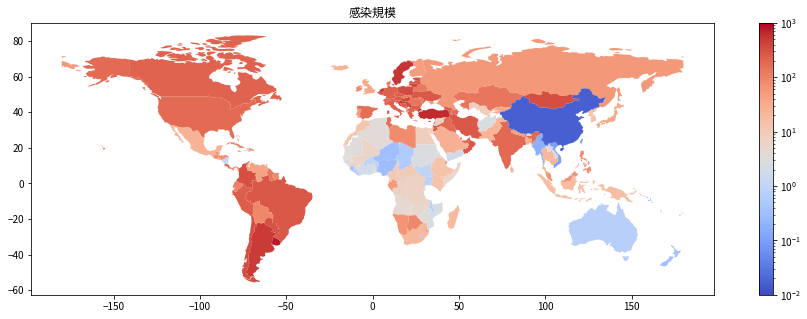

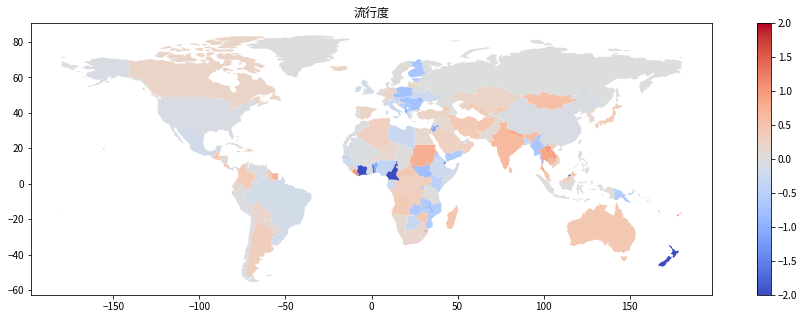

In [15]:
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
world["country"] = [get_country(c) for c in world["iso_a3"]]
world = pd.merge(world, status, on="country", how="inner")
fig,ax=plt.subplots(figsize=(16,5))
world.plot(ax=ax, column=new_cases_label, legend=True, cmap="coolwarm", norm=matplotlib.colors.LogNorm(vmin=ymin, vmax=ymax))
ax.set_title("感染規模")
display(fig)
plt.savefig("world_trends/per_mill-ww-heatmap.png")
plt.close()

fig,ax=plt.subplots(figsize=(16,5))
world.plot(ax=ax, column="trend_cases", legend=True, cmap="coolwarm", norm=matplotlib.colors.Normalize(vmin=xmin, vmax=xmax))
ax.set_title("流行度")
display(fig)
plt.savefig("world_trends/trend-ww-heatmap.png")
plt.close()

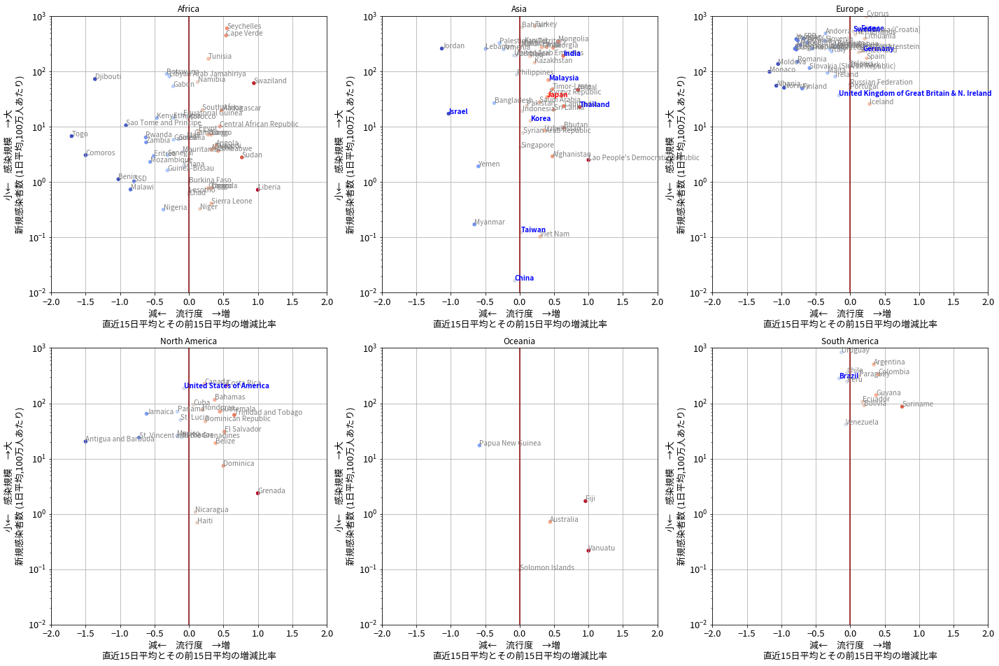

In [16]:
fig,axs=plt.subplots(2,3, figsize=(24, 16))
index=0
axs = axs.reshape(-1) # m x n のグラフ表示では必要
jp_x = None
jp_y = None
jp_index = None
for continent, df in status.groupby("continent"):
    ax = axs[index]
    df.plot(ax=ax, kind="scatter", grid=True, 
            x="trend_cases", xlim=(xmin,xmax), 
            y=new_cases_label, logy=True, ylim=(ymin, ymax), 
            title=continent, label=continent,
            fontsize=13,
            legend=False,
            colorbar=False,
            c="trend_cases", colormap="coolwarm", vmin=-1, vmax=1, 
            figsize=(24,16), layout=(2,3))
    ax.set_ylabel("小←　感染規模　→大\n新規感染者数 (1日平均,100万人あたり)", fontsize=13)
    ax.set_xlabel("減←　流行度　→増\n直近{freq}日平均とその前{freq}日平均の増減比率".format(freq=freq), fontsize=13)
    ax.vlines(0, ymin, ymax, linestyles="solid", color="darkred")
    for i,r in df.iterrows():
        x = r["trend_cases"]
        y = r[new_cases_label]
        country = r["country"]
        if xmin <= x and x < xmax and ymin <= y and y < ymax:
            if country == "Japan":
                jp_x = x
                jp_y = y
                jp_index = index
                continue
            else:
                color = "grey"
                if country in countries:
                    fontweight = "bold"
                    color = "blue"
                else:
                    fontweight = "normal"
            ax.annotate(country, xy=(x, y), color=color, fontweight = fontweight)
    index+=1
axs[jp_index].annotate("Japan", xy=(jp_x, jp_y), color="red", fontweight = "bold")
display(fig)
#    plt.savefig("world_trends/trend-%s.png"%continent)
plt.savefig("world_trends/trend-continents.png", facecolor="white")
plt.close()

## 第N波到来判定ロジック（その１）　→うまくいっていない
最大値の1/10以下の期間を挟んだら一回収束したと判定し、現在が第N波であると判定する。
- 現在の状況が上昇トレンドならN.0と表現
- 第N波中のピークを以前に迎えており、それよりも下降していたら、下記の計算式を用いてN.mと表現

   $m=\frac{ピークからの経過時間}{流行開始からの経過時間}$

In [17]:
def calc_waves(c, df):
    mean = df[["continent", "new_cases"]].rolling(7).mean()
    max_cases  = mean["new_cases"].max()
    threshold = max_cases / 10
    #lower = mean.loc[mean["new_cases"]<threshold]
    higher = mean.loc[mean["new_cases"]>=threshold]
    #timeline = higher.join(lower, how="outer", lsuffix="-higher", rsuffix="-lower")
    #if timeline.shape[0] > 0:
    #    timeline.plot(title=get_country(c))
    period = higher.reset_index()
    period["date_diff"] = (period["date"].diff() - timedelta(1)).fillna(timedelta(0)).cumsum()
    cont = []
    for k, pdf in period.groupby("date_diff"):
        dates = pdf["date"]
        start  = pdf.loc[dates == dates.min(), "date"].values
        end    = pdf.loc[dates == dates.max(), "date"].values
        days   = pdf["date_diff"].shape[0]
        g_mean = pdf["new_cases"].rolling(7).mean()
        peak   = pdf.loc[g_mean == g_mean.max(), "date"].values
        
        if days >= 21 and len(start) > 0 and len(end) > 0 and len(peak) > 0:
            cont.append( (pdf.iloc[0]["date"], days, peak[0], (end[0] - peak[0]) / (end[0] - start[0])) )
    
    return (c, df.iloc[0]["continent"], len(cont), 
            ([0]+[i[1] for i in cont])[-1], 
            ([0] + [i[2] for i in cont])[-1],
            ([0] + [i[3] for i in cont])[-1])

waves = pd.DataFrame([calc_waves(c, df) for c, df in data.items()], columns=["country", "continent", "waves", "continuous", "peak", "trend"])
waves["waves+"] = waves["waves"] + waves["trend"]
display(waves)

,country,continent,waves,continuous,peak,trend,waves+
0,ABW,North America,0,0,0,0.000000,0.000000
1,AFG,Asia,2,73,2020-11-26T00:00:00.000000000,0.513889,2.513889
2,AGO,Africa,2,62,2021-04-25T00:00:00.000000000,0.000000,2.000000
3,AIA,North America,0,0,0,0.000000,0.000000
4,ALB,Europe,2,233,2021-02-15T00:00:00.000000000,0.297414,2.297414
...,...,...,...,...,...,...,...
203,WSM,Oceania,0,0,0,0.000000,0.000000
204,YEM,Asia,2,60,2021-04-07T00:00:00.000000000,0.305085,2.305085
205,ZAF,Africa,2,96,2021-01-15T00:00:00.000000000,0.357895,2.357895
206,ZMB,Africa,2,102,2021-01-22T00:00:00.000000000,0.722772,2.722772


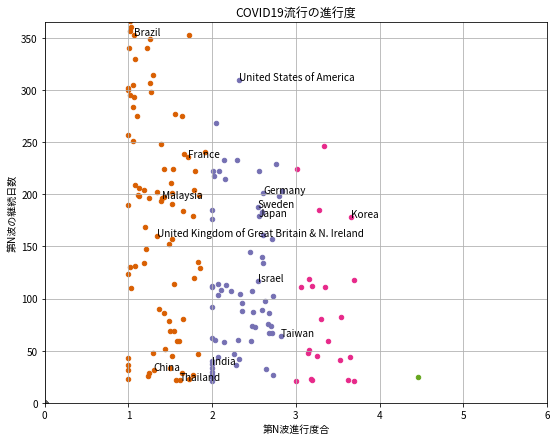

In [18]:
cmap = plt.get_cmap('Dark2')
colors = [cmap(c / 8) for c in np.arange(1, 8)]

fig,ax=plt.subplots(1,1, figsize=(9,7))
for i, wv in waves.groupby("waves"):
    wv.plot(ax=ax, kind="scatter", grid=True, 
            x="waves+", xlim=(0,6), 
            y="continuous", ylim=(0, 365),
            title="COVID19流行の進行度",
            legend=False, color=colors[i-1])
    ax.set_ylabel("第N波の継続日数")
    ax.set_xlabel("第N波進行度合")
for i,r in waves.iterrows():
    x = r["waves+"]
    y = r["continuous"]
    country = get_country(r["country"])
    if (country in countries) and 0 <= x and x < 6 and 0 <= y and y < 365:
        ax.annotate(country, xy=(x, y))
display(fig)
plt.savefig("world_trends/waves.png")
plt.close(fig)

## 第N波判定ロジック（その２）
前後20日の移動平均の前日との差分から現在が上昇/下降のいずれかであるかを判定し、上昇→下降で第N派が終わったとみなして判定。
長期的なトレンドを見るために以下の処理を追加。
- 微細な変化（７日以内）の変化は無視して「変化なし」扱いとする
- 最大の上昇/下降変化に対して2.5%以内の微細な変化は「変化なし」扱いとする

In [19]:
def calc_waves2(c, df):
    # 前後20日間の移動平均を取る
    trend = df[["continent", "new_cases"]].rolling(20,center=True, min_periods=1).mean()
    # 移動平均の差分を計算し、さらに20日間の移動平均で丸める
    trend["sign"] = trend["new_cases"].diff().fillna(0).rolling(20,center=True, min_periods=1).mean()
    # 差分の絶対値が最大値の1/40未満の要素を0に切り下げ
    trend_max     = trend["sign"].max()
    trend.loc[trend["sign"].abs() < trend_max / 40, "sign"] = 0
    # 符号を計算
    trend["sign"] = np.sign(trend["sign"])
    # 符号が連続する期間を計算し、グループ番号(step)を振る
    trend["step"] = trend["sign"].diff().fillna(0).abs().cumsum()

    # 符号が連続する期間をまとめ、期間を行に持つDataFrameを作成する
    def extract_region(step, rdf):
        start = rdf.loc[rdf["date"] == rdf["date"].min(), "date"].values[0]
        end   = rdf.loc[rdf["date"] == rdf["date"].max(), "date"].values[0]
        return [(end - start) / np.timedelta64(1, 'D') + 1, rdf["sign"].values[0], rdf["new_cases"].sum()]    
    result = pd.DataFrame([extract_region(step, rdf) for step, rdf in trend.reset_index().groupby("step")], columns=["days", "sign", "new_cases"])
    
    # 連続が7日以内の短期変化は符号を0にして均す
    result.loc[result["days"] < 7, "sign"] = 0
    result["step"] = result["sign"].diff().fillna(0).abs().cumsum()

    # 符号が0で連続する期間をまとめる
    def sum_zeros(rdf):
        return rdf.sum()
    result = result.groupby("step").apply(sum_zeros).drop("step", axis=1)
    return result

waves2 = dict([(c, calc_waves2(c, ddf)) for c, ddf in data.items()])

### 可視化

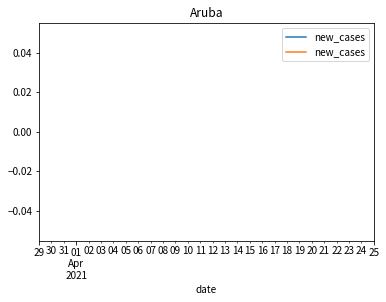

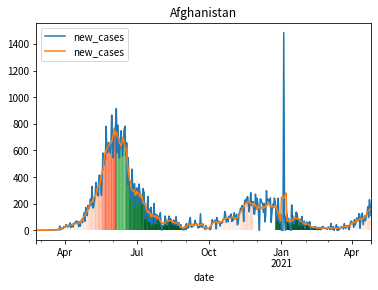

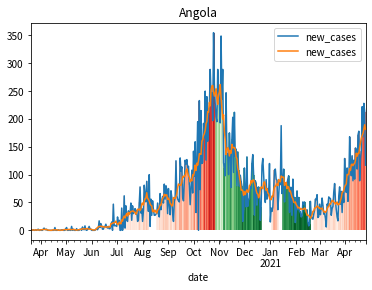

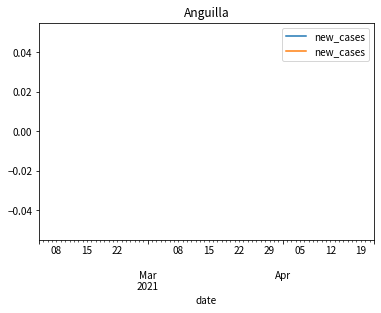

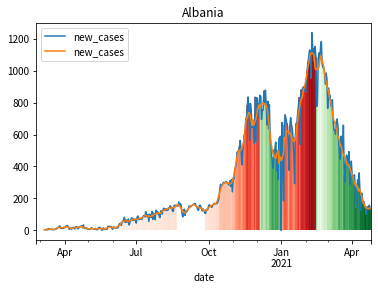

...

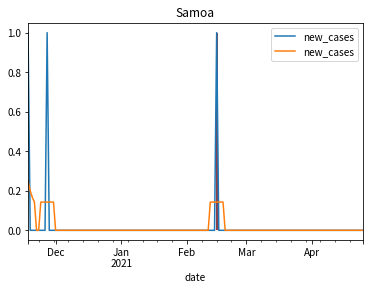

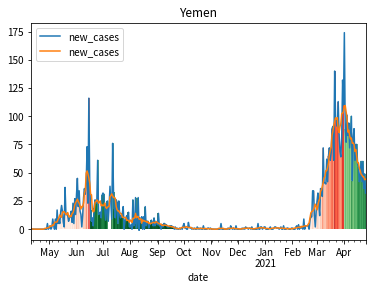

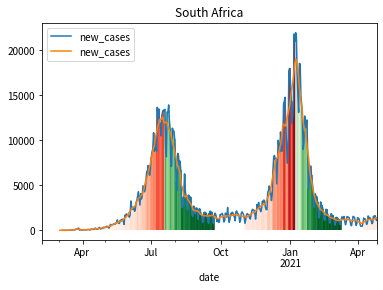

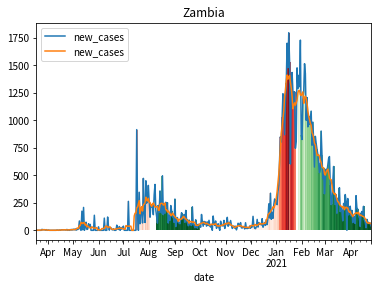

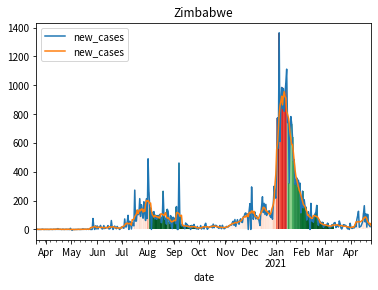

In [20]:
reds   = plt.get_cmap('Reds')
greens = plt.get_cmap('Greens')
for wvs, dfs in zip(waves2.items(), data.items()):
    c,wv = wvs
    cc,df = dfs
    
    # 新規感染者数をプロット
    ax  = df.plot(y="new_cases", title=get_country(c))
    df.rolling(7,center=True, min_periods=1).mean().plot(ax=ax, y="new_cases", title=get_country(c))

    # 上昇/下降の期間を色で表現。最大値に対する振れ幅で色の濃淡を変えて表示する
    day = df.reset_index()["date"].dt.to_pydatetime()[0]
    target = data[c].reset_index()
    y_max  = target["new_cases"].max()

    def to_reds(x):
        return reds(x / y_max)
    def to_greens(x):
        return greens(1 - x / y_max)
    
    # xsに含まれる期間のy1s - y2sの間を塗りつぶす。その際、y2s-y1sの値で色の濃淡を決定する
    def fill_between(xs, y1s, y2s, colors):
        for i in range(0, len(xs)):
            x1  = xs[i]
            y11 = y1s[i]
            y21 = y2s[i]
            c1  = colors[i]
            if c1 == 0:
                c1 = (0,0,0)
            plt.vlines(x1, y11, y21, color=c1)
    
    # 上昇/下降期間ごとに上昇/下降の色で塗りつぶす
    for index, r in wv.iterrows():
        sign = r["sign"]
        if sign != 0:
            period  = target.loc[(target["date"] >= day) & (target["date"]<=day+timedelta(days=r["days"]))]
            days    = [day + timedelta(days=i) for i in range(0, r["days"].astype(int))]
            days_df = pd.DataFrame(days, columns=["cont_date"])
            ys      = pd.merge(days_df, period[["date", "new_cases"]], how="left", left_on="cont_date", right_on="date").fillna(0)["new_cases"]
            colors  = period.copy()
            to_color = to_reds if sign > 0 else to_greens
            colors["color"] = period["new_cases"].apply(to_color)
            colors  = pd.merge(days_df, colors, how="left", left_on="cont_date", right_on="date").fillna(0)["color"]
            
            fill_between(days, [0]*len(days), ys, colors)
        day += timedelta(days=r["days"])
    plt.show()
    ax.figure.savefig("world_trends/country/waves/trend-%s.png"%get_country(c), facecolor="white")
    ax.figure.clf()

Extracting training data
[  1.0828511 -19.4833085]
倍化時間：8.708156日


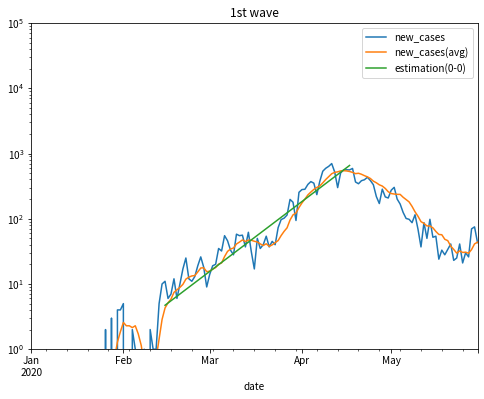

Extracting training data
[  1.0675568  -76.41785679]
倍化時間：10.603011日


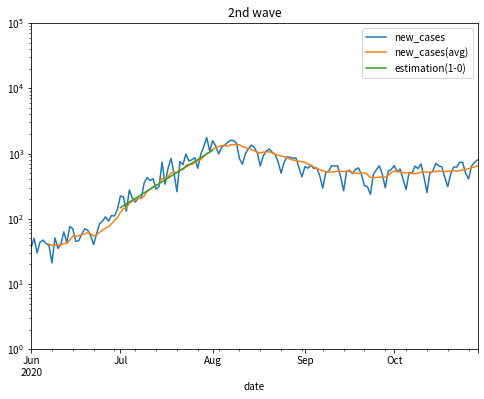

Extracting training data
[   1.05159453 -129.75200004]
倍化時間：13.778176日
Extracting training data
[   1.01552113 -490.46859423]
倍化時間：45.003986日
Extracting training data
[   1.0307377  -275.62413374]
倍化時間：22.895214日


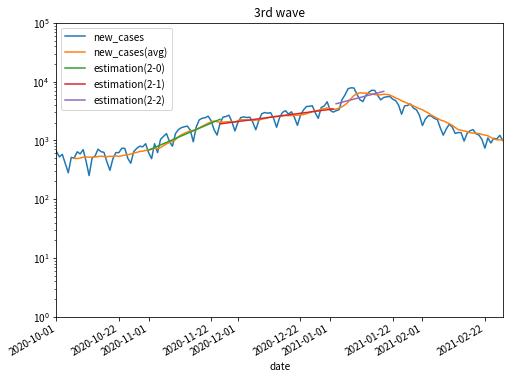

Extracting training data
[   1.03805416 -186.48308275]
倍化時間：18.559172日


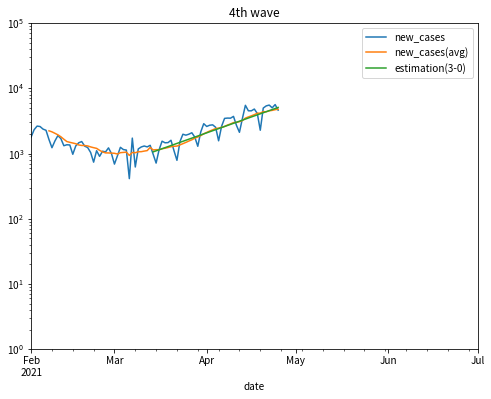

In [21]:
from scipy.optimize import curve_fit
import math

def power_func(x, a, c):
    return (a ** (x-c))

# フィッティング
def fit(df, col, FITTING_START, FITTING_END):
    print("Extracting training data")
    training = df.loc[(df.index >= FITTING_START) & (df.index <= FITTING_END)].copy()
    training["x"] = (training.index - FITTING_START).map(lambda x: x.days)
#    display(training)
    params, cov = curve_fit(power_func, training["x"], training[col], maxfev=100000)
    return params

target_data = data["JPN"]
def num_ord(d):
    suffix = ["th", "st", "nd", "rd"]
    target = d % 10
    if target > 0 and target < 4:
        return "%d%s"%(target, suffix[target])
    else:
        return "%d%s"%(target, suffix[0])

!mkdir -p world_trends/

DT = datetime.datetime
TD = datetime.timedelta

for i, period in enumerate([
    [DT(2020,  1, 1), None, [DT(2020, 2, 15), DT(2020, 4, 17)]], 
    [DT(2020,  6, 1), None, [DT(2020, 7, 1), DT(2020, 8, 1)]], 
    [DT(2020, 10, 1), None, [DT(2020, 11, 1), DT(2020, 11, 25)], [DT(2020, 11, 25), DT(2021, 1, 2)], [DT(2021, 1, 3), DT(2021, 1, 19)]],
    [DT(2021,  2, 1), None, [DT(2021, 3, 14), DT.now()]], 
]):
    period[1] = period[0] + TD(days=150)
    target_period = target_data.loc[(target_data.index>=period[0]) & (target_data.index<=period[1])].copy()
    target_period["new_cases(avg)"] = target_period["new_cases"].rolling(7).mean()

    fitting_periods = period[2:]
    estimated_ys = []
    eval = None
    for j, fp in enumerate(fitting_periods):
        params = fit(target_period, "new_cases(avg)", fp[0], fp[1])
        print(params)
        print("倍化時間：%f日"%(math.log(2) / math.log(params[0])))
        e = target_period.loc[(target_period.index>=fp[0])&(target_period.index<=fp[1])].copy()
        e["x"] = (e.index - fp[0]).map(lambda x: x.days)
        new_y = "estimation(%d-%d)"%(i,j)
        e[new_y] = e["x"].map(lambda x: power_func(x, *params))
        estimated_ys.append(new_y)
        if not eval is None:
            eval = pd.concat([eval, e])
        else:
            eval = e
    eval = eval[["x"] + estimated_ys]
    target_period = target_period.join(eval, how="outer")

    ord_text = num_ord(i+1)
    ax = target_period.plot(kind="line", logy=True, y = ["new_cases", "new_cases(avg)"] + estimated_ys, ylim =(10**0,10**5), xlim=(period[0], period[1]), figsize=(8, 6), title = "%s wave"%ord_text)
    plt.show()
    ax.figure.savefig("world_trends/jpn-positive-logscale-%s.png"%ord_text)
    plt.close()

In [22]:
d1=data["DEU"]["new_cases_per_million"]
d2=data["GBR"]["new_cases_per_million"]
d3=data["ISR"]["new_cases_per_million"]
d4=data["JPN"]["new_cases_per_million"]
display(d1)
display(d2)
display(d3)
display(d4)
display(d4[-1]/d1[-1])
display(d4[-1]/d2[-1])
display(d4[-1]/d3[-1])


date
2020-01-27      0.012
2020-01-28      0.036
2020-01-29      0.000
2020-01-30      0.000
2020-01-31      0.012
               ...   
2021-04-21    290.676
2021-04-22    378.605
2021-04-23    265.707
2021-04-24    172.133
2021-04-25    183.794
Name: new_cases_per_million, Length: 455, dtype: float64

date
2020-01-31     0.029
2020-02-01     0.000
2020-02-02     0.000
2020-02-03     0.088
2020-02-04     0.000
               ...  
2021-04-21    35.707
2021-04-22    40.745
2021-04-23    40.568
2021-04-24    31.258
2021-04-25    25.528
Name: new_cases_per_million, Length: 451, dtype: float64

date
2020-02-20       NaN
2020-02-21     0.116
2020-02-22     0.000
2020-02-23     0.000
2020-02-24     0.000
               ...  
2021-04-22    36.393
2021-04-23     9.820
2021-04-24     9.474
2021-04-25     5.777
2021-04-26       NaN
Name: new_cases_per_million, Length: 432, dtype: float64

date
2020-01-22       NaN
2020-01-23     0.000
2020-01-24     0.000
2020-01-25     0.000
2020-01-26     0.016
               ...  
2021-04-21    42.451
2021-04-22    43.692
2021-04-23    39.644
2021-04-24    44.451
2021-04-25    36.552
Name: new_cases_per_million, Length: 460, dtype: float64

0.19887482725224978

1.4318395487308055

nan